<a href="https://colab.research.google.com/github/mak109/cs6910_assignment2/blob/main/PART%20A/cs6910_assignment2_partA_question4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Visualization and Testing part
  In this part we find the test accuracy on the best model found and we did the following
   - Found the test accuracy
   - Plotted an image grid of 10X3 showing true vs predicted label based on best model


In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
import numpy as np
import random
import os
from zipfile import ZipFile
from PIL import Image
from matplotlib import gridspec
plt.rcParams["figure.figsize"] = (20,10)

In [3]:
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
import random
random.seed(123)

In [4]:
import wandb
os.environ['WANDB_ENTITY'] = 'ipda526'
os.environ['WANDB_PROJECT'] = 'baseline-drowsiness-detection'
wandb.login(key='') #place your wandb api key here

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [5]:
test_dir = '/kaggle/input/drowsy-test-mayukh/test' #Place your own test images here(in kaggle) as this one is private

In [6]:
image_size = (256,256)

In [ ]:
# For best run in terms of metric for a particular sweep
# api = wandb.Api()
# sweep = api.sweep("ipda526/baseline-drowsiness-detection/oreffrwz")
# best_run = sweep.best_run()
# best_run.id

In [7]:
#Using run's artifact to download a particular epoch's model
run = wandb.init()
model_url = 'ipda526/baseline-drowsiness-detection/run_xc3l8g28_model:v55'
artifact = run.use_artifact(model_url, type='model')
artifact_dir = artifact.download()
model = keras.models.load_model(artifact_dir)
model.summary()

wandb: Currently logged in as: mayukhdas04 (ipda526). Use `wandb login --relogin` to force relogin


wandb: Downloading large artifact run_xc3l8g28_model:v55, 110.74MB. 5 files... 
wandb:   5 of 5 files downloaded.  
Done. 0:0:3.0


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 128)     9728      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 128)    0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 128, 128, 128)     0         
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 256)     295168    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 256)      0         
 2D)                                                    

In [8]:
#Using run's model-best.h5 file for best model
run_path = 'ipda526/baseline-drowsiness-detection/xc3l8g28'
api = wandb.Api()
run = api.run(run_path)
run.file('model-best.h5').download(replace=True)
model = keras.models.load_model('model-best.h5')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 128)     9728      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 128)    0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 128, 128, 128)     0         
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 256)     295168    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 256)      0         
 2D)                                                    

## Test Accuracy on best model loaded above

In [14]:
test_generator = ImageDataGenerator(data_format='channels_last').flow_from_directory(
        test_dir,
        target_size = image_size,
        batch_size = 200,
        color_mode = 'rgb',
        class_mode = 'sparse',
        shuffle=False,
        seed=123
        )
test_loss,test_acc = model.evaluate(test_generator)
print(f"Test Accuracy : {test_acc} Test loss : {test_loss}")
class_names =list(test_generator.class_indices)

Found 29 images belonging to 3 classes.


/opt/conda/lib/python3.7/site-packages/keras/backend.py:5586: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits, "Softmax", "sparse_categorical_crossentropy"


1/1 [==============================] - 19s 19s/step - loss: 7.3634 - accuracy: 0.3103
Test Accuracy : 0.3103448152542114 Test loss : 7.363365650177002


In [15]:
#Sampling from test data for visualization part
images=[]
labels=[]
pred_labels = []
for count in range(len(class_names)):
    Images,Labels = next(iter(test_generator))
    for Image,Label in random.sample(list(zip(Images,Labels)),9):
        images.append(Image)
        labels.append(Label.astype('int'))
        Image_scaled = np.expand_dims(Image,axis=0)
        pred_labels.append(tf.argmax(model.predict(Image_scaled),1).numpy()[0])

1/1 [==============================] - 1s 580ms/step


In [16]:
#Printing number of correct labels
np.sum(np.array(labels)==pred_labels)

5

In [17]:
#Number of images
len(images)

27

## Image grid of 10X3 showing true vs predicted label based on best model

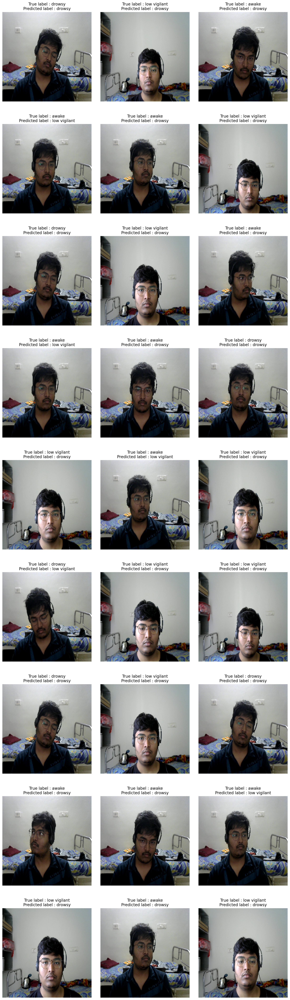

In [18]:
idx=0
fig = plt.figure(figsize=(60,60))
g = gridspec.GridSpec(10,3,wspace=0.1,left=0.7,right=0.9)
for i in range(9):
    for j in range(3):
        ax = plt.subplot(g[i,j])
        ax.imshow(images[idx].astype("uint8"))
        title = f"True label : {class_names[labels[idx].astype('int')]}\nPredicted label : {class_names[pred_labels[idx]]}"
        ax.set_title(title)
        ax.axis("off")
        idx += 1
# plt.savefig("test_image_37percent.jpg",bbox_inches="tight") 